In [4]:
!nvidia-smi

Sat May 23 09:24:38 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [5]:
import tensorflow as tf


print('TensorFlow Version', tf.__version__)
print('GPU is ', 'available.' if tf.test.is_gpu_available() else 'NOT AVAILABLE!')

TensorFlow Version 2.2.0
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU is  available.


In [0]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import time
import glob

from IPython import display

In [0]:
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

In [0]:
train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
train_images = (train_images - 127.5) / 127.5

train_labels = tf.one_hot(train_labels, depth=10)
train_labels = tf.cast(train_labels, tf.float32)

In [0]:
buffer_size = 60000
batch_size = 256

In [0]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_labels)).shuffle(buffer_size).batch(batch_size).prefetch(1)

In [0]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(7*7*256, use_bias=False, input_shape=(110,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    model.add(tf.keras.layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256)
    
    model.add(tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    model.add(tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    model.add(tf.keras.layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 28, 28, 1)
    
    return model

In [12]:
generator = make_generator_model()
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 12544)             1379840   
_________________________________________________________________
batch_normalization (BatchNo (None, 12544)             50176     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 12544)             0         
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 7, 7, 128)         819200    
_________________________________________________________________
batch_normalization_1 (Batch (None, 7, 7, 128)         512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 7, 7, 128)         0

In [13]:
noise = tf.random.normal([1, 100])
labels = [0]
labels = tf.one_hot(labels, depth=10)
labels = tf.cast(labels, tf.float32)
noise = tf.concat([noise, labels], 1)

print('noise.shape:', noise.shape)

noise.shape: (1, 110)


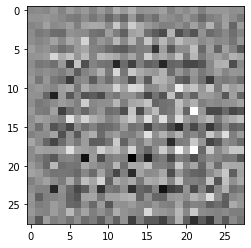

In [14]:
generated_image = generator(noise, training=False)
plt.imshow(generated_image[0, :, :, 0], cmap='gray')
plt.show()

In [15]:
generated_image.shape

TensorShape([1, 28, 28, 1])

In [0]:
labels_input = tf.reshape(labels, [1, 1, 1, 10])

In [0]:
generated_input = tf.concat([generated_image, labels_input * tf.ones([1, 28, 28, 10])], 3)

In [18]:
generated_input.shape

TensorShape([1, 28, 28, 11])

In [0]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), 
                                     padding='same', input_shape=[28, 28, 11]))
    
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    
    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1))
    
    return model

In [20]:
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 14, 14, 64)        17664     
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 7, 7, 128)         204928    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 7, 7, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 7, 7, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 6272)             

In [21]:
decision = discriminator(generated_input)
print(decision)

tf.Tensor([[0.04241294]], shape=(1, 1), dtype=float32)


In [0]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    
    return total_loss

In [0]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [0]:
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [0]:
checkpoint_dir = './Ctraining_checkpoints'

if not os.path.exists(checkpoint_dir):
    os.mkdir(checkpoint_dir)

checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer = discriminator_optimizer,
                                 generator = generator,
                                 discriminator = discriminator)

In [0]:
epochs = 1000
noise_dim = 100
num_examples_to_generate = 100

In [28]:
seed = tf.random.normal([num_examples_to_generate, noise_dim])
labels = [i % 10 for i in range(num_examples_to_generate)]
labels = tf.one_hot(labels, depth=10)
labels = tf.cast(labels, tf.float32)
seed = tf.concat([seed, labels], 1)
print(seed.shape)

(100, 110)


In [0]:
@tf.function
def train_step(data_batch):
    
    images = data_batch[0]
    labels = data_batch[1]
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        noise = tf.random.normal([images.get_shape()[0], noise_dim])
        noise_input = tf.concat([noise, labels], 1)
        generated_images = generator(noise_input, training=True)
        
        labels_input = tf.reshape(labels, [images.get_shape()[0], 1, 1, 10])
        
        images_input = tf.concat([images, labels_input * tf.ones([images.get_shape()[0], 28, 28, 10])], 3)
        
        generated_input = tf.concat([generated_images, labels_input * tf.ones([images.get_shape()[0], 28, 28, 10])], 3)
        
        real_output = discriminator(images_input, training=True)
        fake_output = discriminator(generated_input, training=True)
        
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
        
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [0]:
def generate_and_save_images(model, epoch, test_input):
    
    if not os.path.exists('./Cgenerate_images'):
        os.mkdir('./Cgenerate_images')
    predictions = model(test_input, training=False)
    
    fig = plt.figure(figsize=(10, 10))
    
    for i in range(predictions.shape[0]):
        plt.subplot(10, 10, i + 1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')
    
    plt.savefig('./Cgenerate_images/image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

In [0]:
def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()
        
        for data_batch in dataset:
            train_step(data_batch)
        
        display.clear_output(wait=True)
        generate_and_save_images(generator, epoch + 1, seed)
        
        if (epoch + 1) % 5 == 0:
            checkpoint.save(file_prefix = checkpoint_prefix)
        
        print('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))

In [32]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

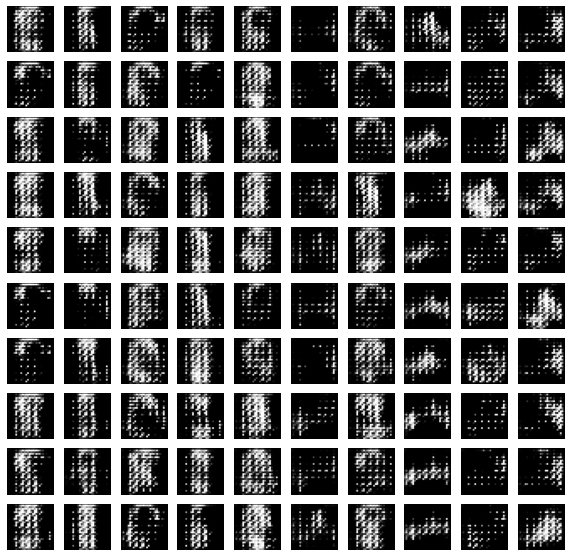

Time for epoch 6 is 10.89248776435852 sec


In [0]:
%%time
train(train_dataset, epochs)

In [0]:
def display_image(epoch_no):
    return PIL.Image.open('./Cgenerate_images/image_at_epoch_{:04d}.png'.format(epoch_no))

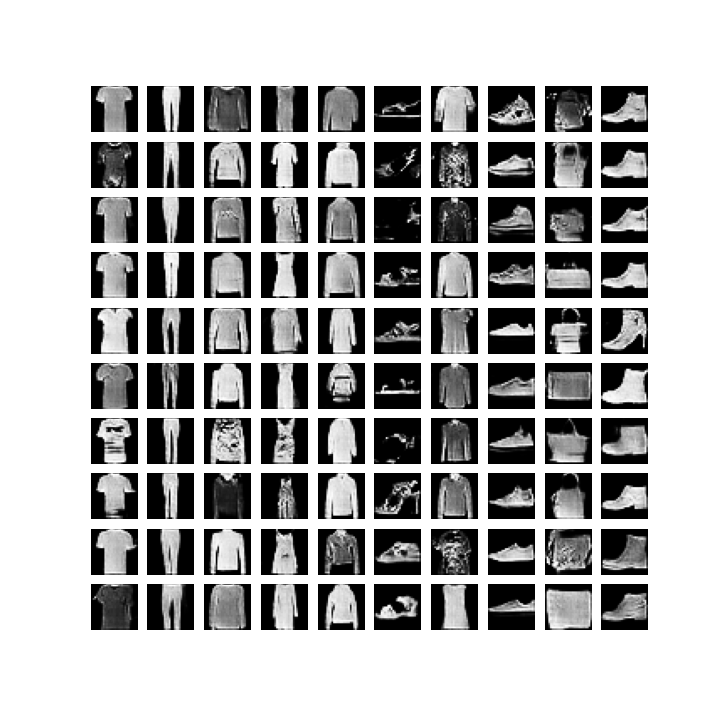

In [34]:
display_image(epochs)

In [0]:
import imageio

anim_file = 'Cdcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('./Cgenerate_images/image*.png')
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2 * (i ** 0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

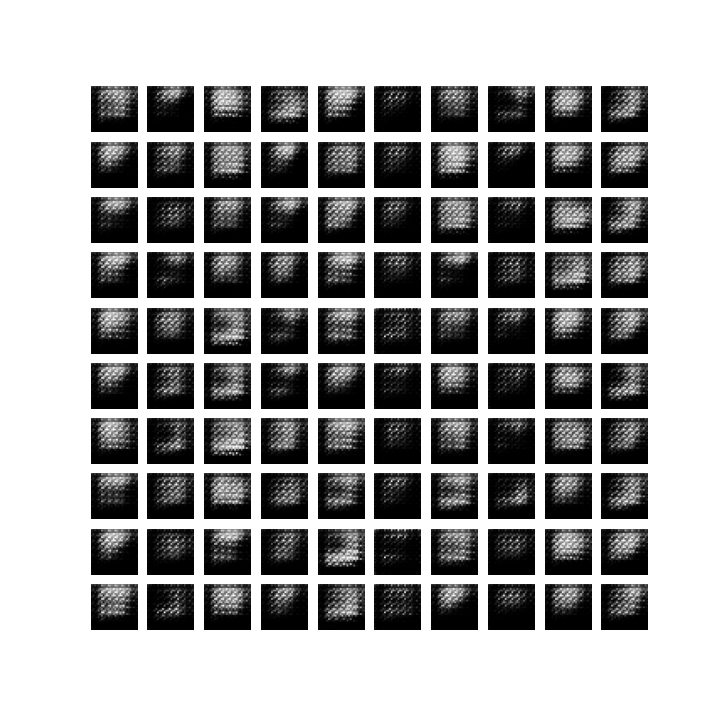

In [39]:
display.Image(open('Cdcgan.gif','rb').read())